# Sélection des données (analyse métier) 

En se basant sur l'analyse de données effectuées on voit que plusieurs colonnes ressortent et peuvent paraître logique quant à leurs utilisations dans un modèle de scoring. Il reste nécessaire bien sûr de vérifier la pérennité de l'utilisation de ces colonnes dans nos modèles.

En recherchant sur internet les facteurs déterminants l'obtention d'un prêt est séparée en 2 facteurs :

Les revenus stables : les salaires nets, les loyers perçus, les bénéfices (activité non salariée), les pensions et rentes reçues. Également les aides et allocations sociales seulement si celles-ci sont assurées pendant la majeure partie de la durée du prêt.
les charges récurrentes : les crédits en cours, les pensions versées, les loyers éventuels (notamment en cas d'achat d'une résidence secondaire, lorsque vous êtes locataire de votre résidence principale).
On calcule ensuite la différence entre les revenus stables et les charges récurrentes qui constitura les ressources nettes.

𝐶𝐸=(𝑅−𝐶)∗33100
 
CE = Capacité d'emprunt (mensuel)
R = Revenus (mensuel)
C = Charges (mensuel)

En ce qui concerne les revenus variables (commissions, dividendes, remboursement de frais), ils seront pondérés en fonction de l'ancienneté dans la profession et de la part qu'ils représentent par rapport au revenu fixe. On ne s'interresera pas à ce cas ici.

Définition : Annuité : paiement annuel d'une partie du capital emprunté

Ce calcul est effectué pour les prêts classiques, en regardant d'autres facteurs discriminatoires comme l'historique bancaire.
Ici l'entreprise "prêt à dépenser" veut miser sur d'autres facteurs afin de rendre les prêts bancaires plus accessibles aux personnes même avec peu d'historique bancaire.

Par exemple, on pourrait sélectionner les colonnes suivantes (élément discriminatoire basé, entre autres, sur la corrélation avec la variable cible ) :

Pour Application Train

variable qualitative :
CODE_GENDER
NAME_HOUSING_TYPE (type de maison dans lequel vie le client => indique sa situation actuelle)
NAME_EDUCTION_TYPE (indique son niveau d'étude et donc potentiellement son potentiel à trouver facilement du travail, mais dépend des secteur, peut-être biaiser selon les périodes et les tendances du marcher)
NAME_FAMILY_STATUS (situation familiale, célibataire aura plus de mal a trouver des fonds s'il y a des imprévus)
OCCUPATION_TYPE / ORGANIZATION_TYPE / NAME_INCOME_TYPE (métier du client et type d'entreprise et statut actuel, secteur attractif et peu de chômage => pas de difficulté à rembourser car peut honorer sa dette tous les mois)
EMERGENCYSTATE_MODE (prêt pour état d'urgence = situation difficile => difficulté à rembourser)

variable quantitative :
DAYS_BIRTH (indique la maturité du client)
DAYS_EMPLOYED (indique la stabilité de travail du client)
OWN_CAR_AGE (indique l'âge du véhicule du client car un vieux véhicule coûte souvent plus chère en réparation et amène par la suite à un changement de véhicule et donc surment un nouveau prêt)
EXT_SOURCE_{1,2,3} (indique un score du client sur la base de plusieurs autres facteurs)
DAYS_LAST_PHONE_CHANGE (indique depuis combien de temps le client a changé de téléphone => dépensier)
AMT_INCOME_TOTAL (revenue du client)
AMT_CREDIT (montant du crédit)
AMT_GOODS_PRICE (prix du bien pour lequel le prêt est accordé)
AMT_ANNUITY (annuité du prêt)
DEF_{30|60}_CNT_SOCIAL_CIRCLE / OBS_{30|60}_CNT_SOCIAL_CIRCLE (défaut observable dans l'historique du client sur 30 ou 60 jours)

variable "binaire" :
REG_CITY_NOT_LIVE_CITY (adresse de vie ne correspond à l'adresse de contact au niveau de la ville)
REG_CITY_NOT_WORK_CITY (adresse de vie correspond à celle de l'adresse de son lieu pro au niveau de la ville)
LIVE_CITY_NOT_WORK_CITY (adresse de contact ne correspond pas à l'adresse de travail au niveau de la ville)


Ces informations sont uniquement basées sur la corrélation entre la variable target et les différentes variables et des éléments discriminatoires personnels, cette sélection de variables et certainement perfectible et à ajuster avec l'équipe métier.


On remarque qu'il est possible d'avoir d'autres informations en combinent des colonnes :
Durée de l'emprunt : crédit total divisé par l'annuité
Stabilité du dernier travail : nombre de jours dans le dernier travail divisé par l'âge - 18 ans (peut-être prendre en compte le niveau d'étude pour retirer 20 ans si BAC+2 par exemple) => il manque l'age de début dans la vie active pour avoir une information pertinente...
Reste pour vivre (argent) : salaire annuel moins l'annuité
Reste pour vivre pourcentage : un moins l'annuité divisée par le salaire annuel
Flag véhicule de collection : indique si le véhicule du client est une voiture de collection (la réglementation indique que le véhicule est considéré comme voiture de collection à partir d'une ancienneté de 30 ans)
Flag travail : indique si le client travail (basé sur la colonne DAYS_EMPLOYED)
On peut également récupérer les informations, sur les autres fichiers, des transactions faites pour voir le profil du client sur ces dépenses etc.

In [1]:
%matplotlib inline
import pandas as pd 
import numpy as np
import missingno as msno
from functions import *
import plotly.express as px

import matplotlib.pyplot as plt
import seaborn as sns

import warnings
pd.set_option("display.max_rows",100)  
pd.set_option("display.max_columns",None)
warnings.filterwarnings('ignore')


#preprocessing
from sklearn.preprocessing import LabelEncoder

In [2]:
from sklearn.preprocessing import LabelEncoder

def encoder_variables_qualitative(df, nan_as_category=False):
    
    encoder = LabelEncoder()
    categorical_columns = df.select_dtypes(["object"]).columns.tolist()
    # Label encoder pour labeliser les colonnes binaires
    for col in categorical_columns:
        if len(list(df[col].unique())) <=2 :
            df[col] = encoder.fit_transform(df[col])
            class_convert = {}
            for v,k in zip(range(len(list(encoder.classes_))),list(encoder.classes_)):
                class_convert[k]=v
            print("\n\nConversion colonne :\n",col,"new_values :\n",class_convert)
    
    # One hot encoder pour les autres colonnes
    categorical_columns = df.select_dtypes(["object"]).columns.tolist()
    df = pd.get_dummies(df, columns=categorical_columns, dummy_na=nan_as_category)
    return df

def presentation_data(dataframe,head_size=5):
    print("Dimensionnalité du jeu de données :",dataframe.shape)
    return dataframe.head(head_size)

def plot_dtypes(dataframe):
    print(dataframe.dtypes.value_counts())
    plt.figure(figsize=(12,10))
    plt.pie(dataframe.dtypes.value_counts().values,autopct="%1.2f%%",labels=[str(types) for types in dataframe.dtypes.value_counts().index])
    plt.title("Répartition des types dans le jeu de données.")
    plt.ylabel("Type des données")
    plt.legend()
    plt.show()
    
def missing_value(dataframe,reversed_sort=False,head=None):
    if type(reversed_sort) != bool:
        reversed_sort=False
    miss_value = dataframe.isna().sum().sort_values(ascending =reversed_sort)
    miss_value = pd.DataFrame(miss_value[miss_value.values > 0],columns=["Nombre de valeurs vides"])
    miss_value["Pourcentage sur le total"] = round((miss_value["Nombre de valeurs vides"] / dataframe.shape[0])*100,4)
    if head != None and type(head) == int :
        print(f"Il y a {miss_value.shape[0]} colonnes avec des valeurs manquantes qui sont (pour les {head} premiers):")
        return miss_value.head(head)
    else:
        print(f"Il y a {miss_value.shape[0]} colonnes avec des valeurs manquantes qui sont :")
        return miss_value
    
def high_correlation(dataframe,col_remove=["SK_ID_CURR"],corr_ceil_abs=0.7):
    if len(col_remove) > 0:
        cols = [col for col in dataframe.columns if not col in col_remove]
        correlation = dataframe[cols].corr()
    else:
        correlation = dataframe.corr()
    
    for col in correlation.columns :
        val = correlation.loc[col].loc[abs(correlation.loc[col]) >= corr_ceil_abs].drop(col,axis=0)
        if len(val) > 0:
            print(f"Haute correlation ( > abs({corr_ceil_abs})) de ",col)
            print("-"*50)
            print(val.sort_values(ascending=False))
            print("\n\n")

def analyse_num(dataframe,remove=["Col_ID"],hist_bins=20):
    num_cols = [col for col in dataframe.columns if not col in dataframe.select_dtypes(["object","category"]).columns.to_list()]
    if len(remove) > 0:
        num_cols = [col for col in num_cols if (col not in remove)]

    for col in num_cols:
        fig,axes = plt.subplots(1,2,figsize=(20,5))
        dataframe.hist(str(col),ax=axes[0],bins=hist_bins)
        dataframe.boxplot(str(col),ax=axes[1], vert=False)
        
        axes[1].set_yticklabels([])
        axes[1].set_yticks([])
        axes[0].set_title(col + " | Histogram")
        axes[1].set_title(col + " | Boxplot")
        plt.show()

def analyse_num_with_target_bin(positive_df,negative_df,target_var,remove=["Col_ID"]):
    num_cols = [col for col in positive_df.columns if not col in positive_df.select_dtypes(["object","category"]).columns.to_list()]
    if len(remove) > 0:
        num_cols = [col for col in num_cols if (col not in remove)]
        
    for col in num_cols:
        fig,axes = plt.subplots(1,3,figsize=(25,6))
        sns.distplot(positive_df[col],label="positive",ax=axes[0])
        sns.distplot(negative_df[col],label="negative",ax=axes[0])

        pd.concat([positive_df,negative_df],axis=0).boxplot(str(col),by=target_var,ax=axes[1],vert=False)
        
        pd.concat([positive_df,negative_df],axis=0).boxplot(str(col),ax=axes[2],vert=False)

        axes[0].legend()
        # Taille max du nom de la colonne 50
        axes[0].set_title(col[:50] + " | Distplot")
        axes[1].set_title(col[:50] + " | Boxplot split")
        axes[2].set_title(col[:50] + " | Boxplot global")
        
        axes[0].set_xlabel("")
        axes[1].set_xlabel("")
        axes[2].set_xlabel("")
        
        axes[2].set_yticklabels([])
        axes[2].set_yticks([])
        

        plt.show()

In [3]:
getstart = lambda s, tab : [col for col in tab if col.startswith(s)] 


def reduce_normalized_col(df,endswith="_AVG"):
    all_col_prefix = ["_".join(col.split("_")[:-1]) for col in df.columns if str(col).endswith(endswith)]
    all_col = [col for col in df.columns if "_".join(col.split("_")[:-1]) in all_col_prefix]
    tmp=df.copy()
    for col in all_col_prefix:
        tmp[col] = tmp[getstart(col,all_col)].mean(axis=1)
        tmp.drop(getstart(col,all_col),axis=1,inplace=True)
        
    return tmp

def merge_high_correlation(df,ceil_corr=0.85):
    passed=True
    col_del=[]
    tmp=df.copy()
    while passed:
        passed=False
        corr_tab = tmp.corr()
        for col in corr_tab.columns :
            if not col in col_del:
                val = corr_tab.loc[col].loc[abs(corr_tab.loc[col]) >= ceil_corr].drop(col,axis=0)
                if len(val) > 0:
                    merge_col = [col for col in val.index.tolist() if not col in col_del]
                    if len(merge_col) != 0:
                        passed=True
                        merge_col.append(col)
                        new_name_col = "_X_".join(merge_col)
                        tmp[new_name_col] = tmp[merge_col].mean(axis=1)
                        tmp.drop(merge_col,axis=1,inplace=True)
                        merge_col.append(new_name_col)
                        col_del.extend(merge_col)
    return tmp

In [4]:
def diff_columns(df1, df2):
    columns_df1_not_in_df2 = set(df1.columns) - set(df2.columns)
    columns_df2_not_in_df1 = set(df2.columns) - set(df1.columns)
    return columns_df1_not_in_df2, columns_df2_not_in_df1

In [5]:
def replace_missing_with_median(df, columns):

    for col in columns:
        median_value = df[col].median()
        df[col].fillna(median_value, inplace=True)


In [6]:
def label_encoder(df, columns):
    df_encoded = df.copy()
    encoder = LabelEncoder()
    for col in columns:
        df_encoded[col] = encoder.fit_transform(df[col])
    return df_encoded

In [7]:
application_train = pd.read_csv('data/application_train.csv')
presentation_data(application_train)

Dimensionnalité du jeu de données : (307511, 122)


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [8]:
missing_value(application_train,reversed_sort=False)

Il y a 67 colonnes avec des valeurs manquantes qui sont :


,Nombre de valeurs vides,Pourcentage sur le total
COMMONAREA_MEDI,214865,69.8723
COMMONAREA_AVG,214865,69.8723
COMMONAREA_MODE,214865,69.8723
NONLIVINGAPARTMENTS_MODE,213514,69.4330
NONLIVINGAPARTMENTS_AVG,213514,69.4330
NONLIVINGAPARTMENTS_MEDI,213514,69.4330
FONDKAPREMONT_MODE,210295,68.3862
LIVINGAPARTMENTS_MODE,210199,68.3550
LIVINGAPARTMENTS_AVG,210199,68.3550
LIVINGAPARTMENTS_MEDI,210199,68.3550


### nettoyage des valeurs manquantes

En supprimant toutes les valeurs manquantes on se retrouve avec 97.21% du jeu de données en moins On ne peut donc pas se permettre de juste supprimer les lignes ayant des données manquantes.

On peut commencer par rassembler les colonnes qui indiquent une même mesure pour les assembler. (_AVG,_MEDI,_MODE)

In [9]:
app_train = reduce_normalized_col(application_train)

In [10]:
diff_columns(application_train,app_train)

({'APARTMENTS_AVG',
  'APARTMENTS_MEDI',
  'APARTMENTS_MODE',
  'BASEMENTAREA_AVG',
  'BASEMENTAREA_MEDI',
  'BASEMENTAREA_MODE',
  'COMMONAREA_AVG',
  'COMMONAREA_MEDI',
  'COMMONAREA_MODE',
  'ELEVATORS_AVG',
  'ELEVATORS_MEDI',
  'ELEVATORS_MODE',
  'ENTRANCES_AVG',
  'ENTRANCES_MEDI',
  'ENTRANCES_MODE',
  'FLOORSMAX_AVG',
  'FLOORSMAX_MEDI',
  'FLOORSMAX_MODE',
  'FLOORSMIN_AVG',
  'FLOORSMIN_MEDI',
  'FLOORSMIN_MODE',
  'LANDAREA_AVG',
  'LANDAREA_MEDI',
  'LANDAREA_MODE',
  'LIVINGAPARTMENTS_AVG',
  'LIVINGAPARTMENTS_MEDI',
  'LIVINGAPARTMENTS_MODE',
  'LIVINGAREA_AVG',
  'LIVINGAREA_MEDI',
  'LIVINGAREA_MODE',
  'NONLIVINGAPARTMENTS_AVG',
  'NONLIVINGAPARTMENTS_MEDI',
  'NONLIVINGAPARTMENTS_MODE',
  'NONLIVINGAREA_AVG',
  'NONLIVINGAREA_MEDI',
  'NONLIVINGAREA_MODE',
  'YEARS_BEGINEXPLUATATION_AVG',
  'YEARS_BEGINEXPLUATATION_MEDI',
  'YEARS_BEGINEXPLUATATION_MODE',
  'YEARS_BUILD_AVG',
  'YEARS_BUILD_MEDI',
  'YEARS_BUILD_MODE'},
 {'APARTMENTS',
  'BASEMENTAREA',
  'COMMONAREA

plutot que de garder AVG MEDI MODE pour toutes ces colonnes on a fait la moyenne entre les 3 colonnes de chacune de features, cela allege beaucoup notre jeu de données, et il ny'a aucune perte d'information

In [11]:
all_val_live = ["BASEMENTAREA",
                "COMMONAREA",
                "LANDAREA",
                "LIVINGAREA",
                "NONLIVINGAREA",
                "LIVINGAPARTMENTS",
                "NONLIVINGAPARTMENTS",
                "APARTMENTS",
                "YEARS_BEGINEXPLUATATION",
                "YEARS_BUILD","FLOORSMIN",
                "FLOORSMAX",
                "ENTRANCES",
                "ELEVATORS"]

regardons pour ces features les valeurs manquantes et leur correlation

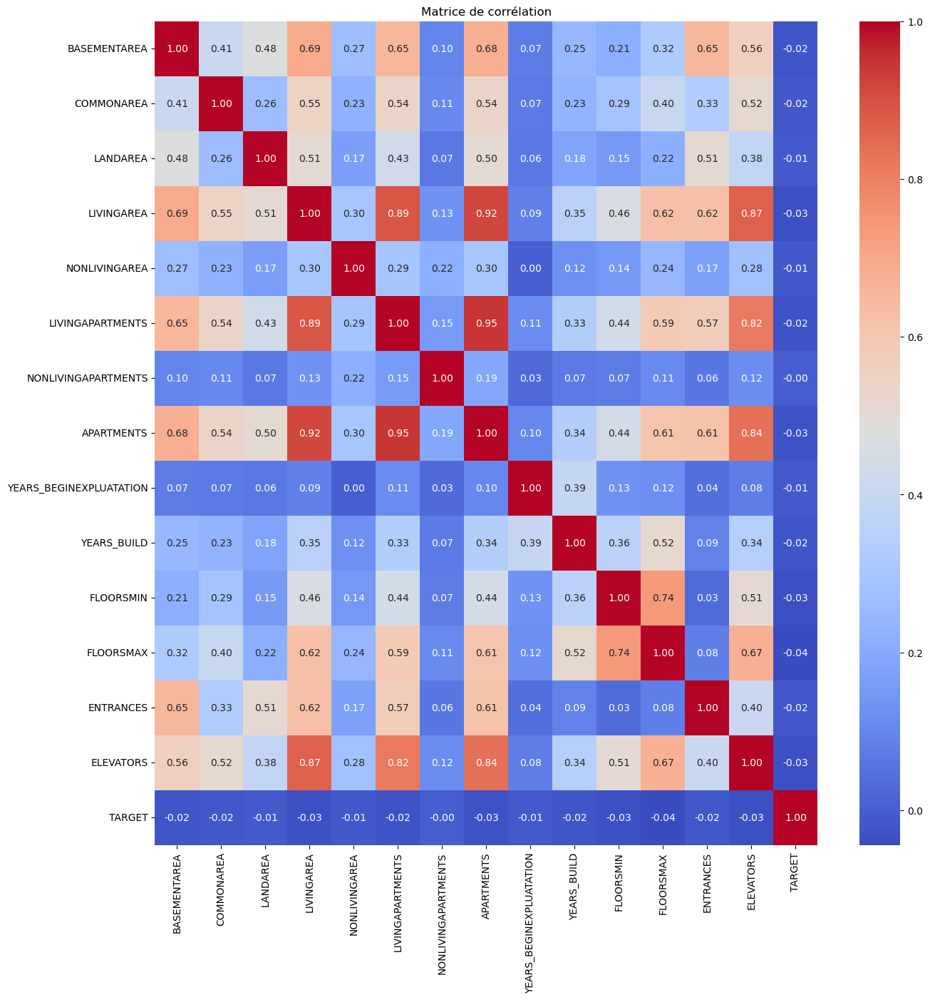

In [12]:
# correlation

# Sélectionnez uniquement les fonctionnalités de votre liste
selected_features = app_train[all_val_live + ['TARGET']]

# Calculez la matrice de corrélation entre ces fonctionnalités
correlation_matrix = selected_features.corr()

plt.figure(figsize=(15, 15))
# Tracez la matrice de corrélation avec Seaborn
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Matrice de corrélation')
plt.show()

<AxesSubplot:>

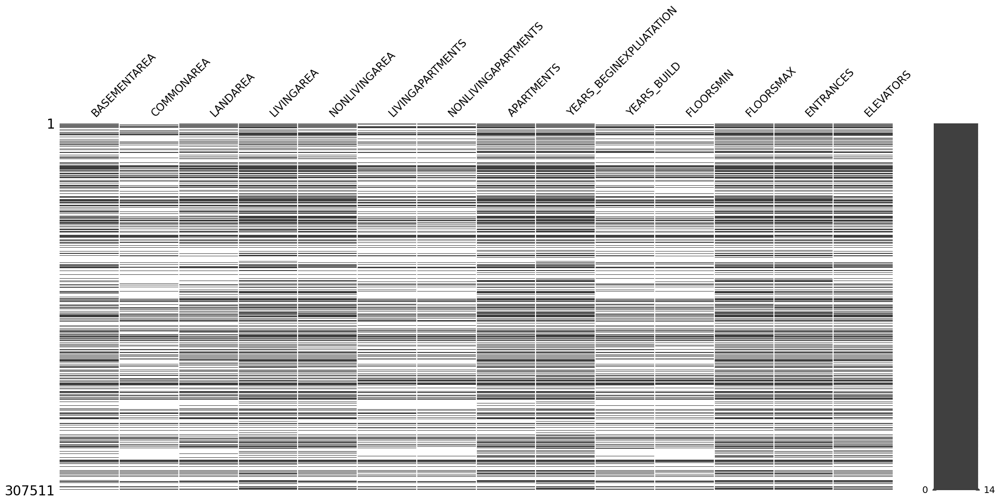

In [13]:
msno.matrix(app_train[all_val_live])

suppresison des colonens avec un tx moyennement elevé de valeurs manquantes

In [14]:
app_train.drop(['COMMONAREA','LIVINGAPARTMENTS','NONLIVINGAPARTMENTS','YEARS_BUILD','FLOORSMIN'],axis=1,inplace=True)

In [15]:
# mise a jour de nos colonnes (- celle que l'on a supprimer
# en raison du nombre de valeurs manquantes)
all_val_live = ["BASEMENTAREA",                
                "LANDAREA",
                "LIVINGAREA",
                "NONLIVINGAREA",                
                "APARTMENTS",
                "YEARS_BEGINEXPLUATATION",             
                "FLOORSMAX",
                "ENTRANCES",
                "ELEVATORS"]

In [16]:
print('les valeurs manquantes dans ces colonnes vont être remplacées par la médiane car cette dernière est moins sensible au outliers, bien que ceux_ci aient été traités préalablement')
replace_missing_with_median(app_train, all_val_live)

les valeurs manquantes dans ces colonnes vont être remplacées par la médiane car cette dernière est moins sensible au outliers, bien que ceux_ci aient été traités préalablement


<AxesSubplot:>

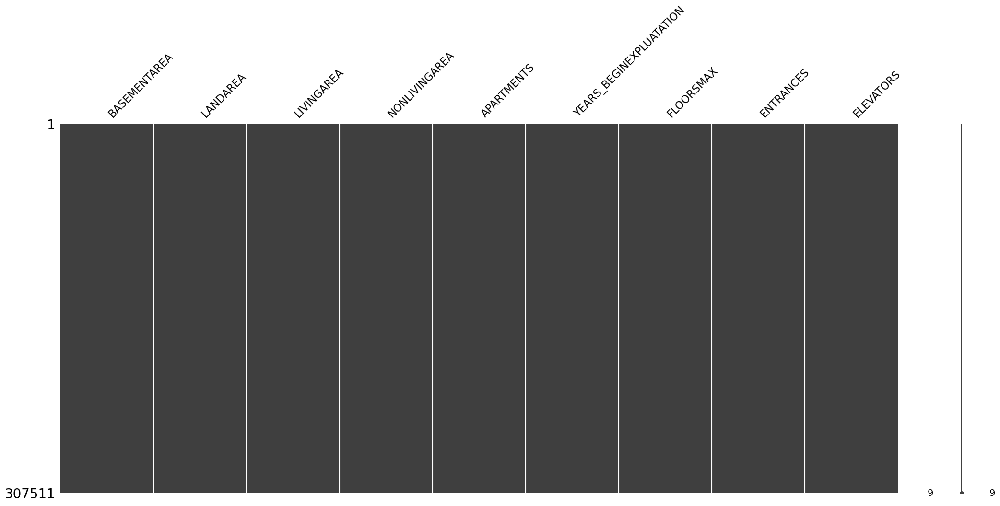

In [17]:
msno.matrix(app_train[all_val_live])

In [18]:
# traitemetn des colonnes relatives a la superficie des logements/terains
area_columns = app_train.filter(regex='AREA')
area_columns

,TOTALAREA_MODE,BASEMENTAREA,LANDAREA,LIVINGAREA,NONLIVINGAREA
0,0.0149,0.037367,0.037367,0.019367,0.000000
1,0.0714,0.053200,0.013000,0.055367,0.006600
2,NaN,0.075633,0.047633,0.074233,0.003233
3,NaN,0.075633,0.047633,0.074233,0.003233
4,NaN,0.075633,0.047633,0.074233,0.003233
...,...,...,...,...,...
307506,0.2898,0.064867,0.043100,0.160633,0.077933
307507,0.0214,0.044033,0.058667,0.026167,0.000000
307508,0.7970,0.087267,0.047633,0.946367,0.000000
307509,0.0086,0.075633,0.047633,0.006200,0.003233


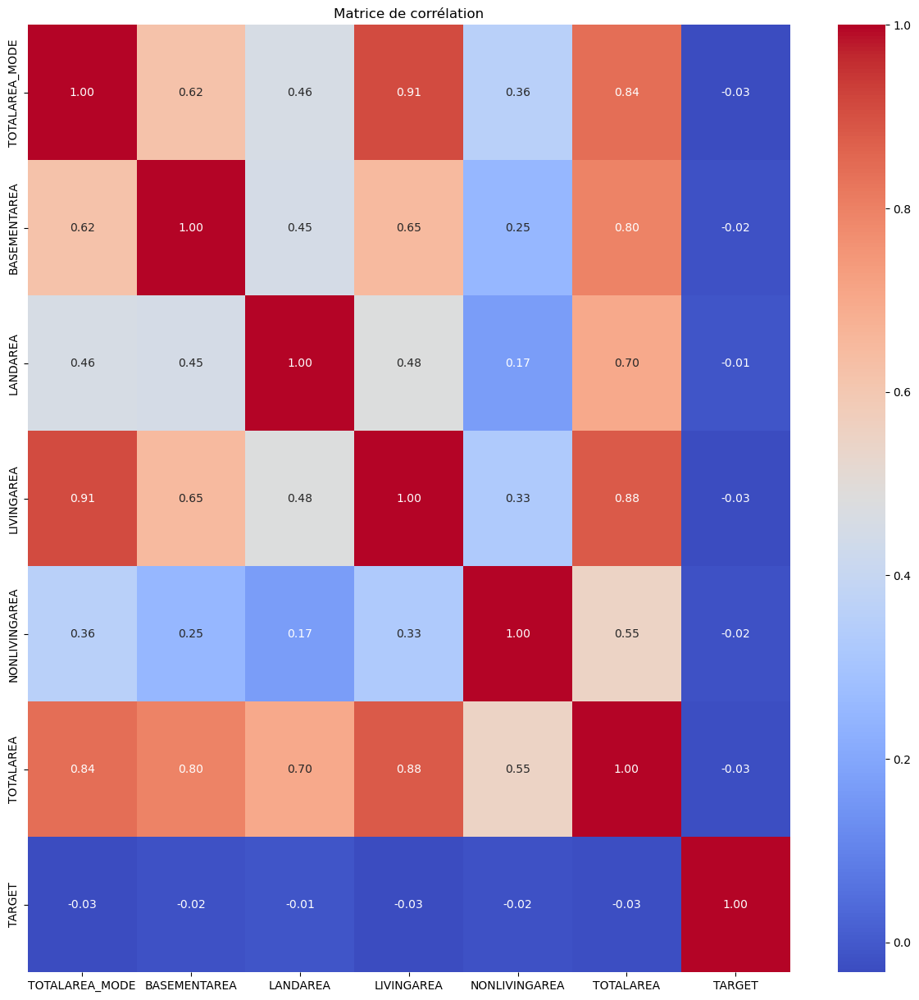

In [19]:
app_train["TOTALAREA"] = app_train[["BASEMENTAREA","LANDAREA","LIVINGAREA","NONLIVINGAREA"]].sum(axis=1)
# # correlation
area = ['TOTALAREA_MODE','BASEMENTAREA','LANDAREA','LIVINGAREA','NONLIVINGAREA','TOTALAREA']
# # Sélectionnez uniquement les fonctionnalités de votre liste
# selected_features = app_train[all_val_live + ['TARGET']]
a = app_train[area + ['TARGET']]
# Calculez la matrice de corrélation entre ces fonctionnalités
correlation_matrix = a.corr()

plt.figure(figsize=(15, 15))
# Tracez la matrice de corrélation avec Seaborn
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Matrice de corrélation')
plt.show()

In [20]:
app_train.drop(['TOTALAREA_MODE','BASEMENTAREA','LANDAREA','LIVINGAREA','NONLIVINGAREA'],axis=1,inplace=True)

In [21]:
# traitement sur floorsmax, entrance et elevator
# traitemetn des colonnes relatives a la superficie des logements/terains
other_columns = ["FLOORSMAX","ENTRANCES","ELEVATORS"]
other_columns

['FLOORSMAX', 'ENTRANCES', 'ELEVATORS']

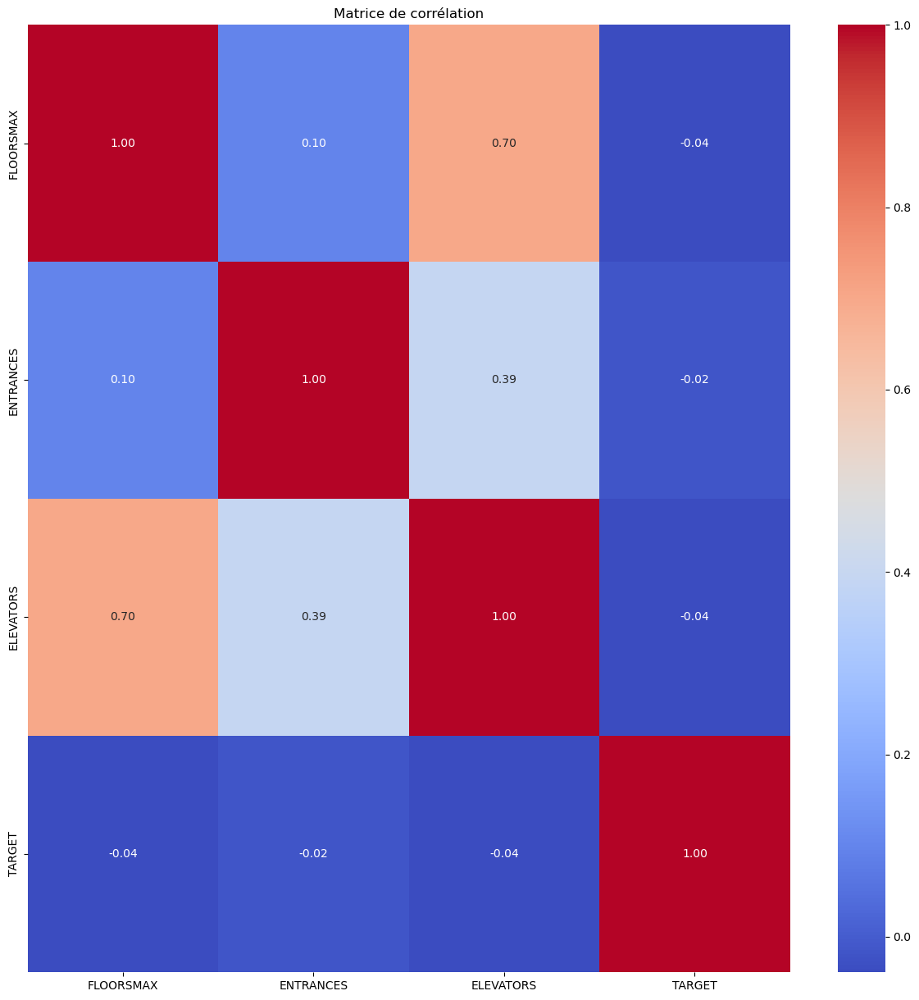

In [22]:
# # Sélectionnez uniquement les fonctionnalités de votre liste
# selected_features = app_train[all_val_live + ['TARGET']]
a = app_train[other_columns + ['TARGET']]
# Calculez la matrice de corrélation entre ces fonctionnalités
correlation_matrix = a.corr()

plt.figure(figsize=(15, 15))
# Tracez la matrice de corrélation avec Seaborn
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Matrice de corrélation')
plt.show()

In [23]:
missing_value(app_train)

Il y a 24 colonnes avec des valeurs manquantes qui sont :


,Nombre de valeurs vides,Pourcentage sur le total
FONDKAPREMONT_MODE,210295,68.3862
OWN_CAR_AGE,202929,65.9908
EXT_SOURCE_1,173378,56.3811
WALLSMATERIAL_MODE,156341,50.8408
HOUSETYPE_MODE,154297,50.1761
EMERGENCYSTATE_MODE,145755,47.3983
OCCUPATION_TYPE,96391,31.3455
EXT_SOURCE_3,60965,19.8253
AMT_REQ_CREDIT_BUREAU_YEAR,41519,13.5016
AMT_REQ_CREDIT_BUREAU_QRT,41519,13.5016


### continuation du nettoyage

In [24]:
# donées telephoniques
# Supposons que les trois colonnes à additionner soient 'colonne1', 'colonne2' et 'colonne3'
app_train['CELLPHONE_ACCESS'] = app_train['FLAG_MOBIL'] + app_train['FLAG_EMP_PHONE'] + app_train['FLAG_PHONE']
px.pie(app_train,names='CELLPHONE_ACCESS')
# Supprimer les variables sur les téléphones
app_train.drop(['FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_PHONE'], axis = 1, inplace = True)

In [25]:
app_train.shape

(307511, 83)

In [26]:
# suppression de colonnes jugées inutiles
app_train.drop(['NAME_TYPE_SUITE', 'REGION_POPULATION_RELATIVE', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 
                      'OWN_CAR_AGE', 'FLAG_WORK_PHONE', 'FLAG_EMAIL', 'FLAG_CONT_MOBILE', 'WEEKDAY_APPR_PROCESS_START', 
                      'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_WORK_CITY',
                     'DAYS_LAST_PHONE_CHANGE'], axis = 1, inplace = True)

- <b>OWN_CAR_AGE</b> : 
- <b>FLAG_WORK_PHONE</b> :
- <b>FLAG_EMAIL</b> : 
- <b>FLAG_CONT_MOBILE</b> : 
- <b>WEEKDAY_APPR_PROCESS_START</b> : jour début processus
- <b>HOUR_APPR_PROCESS_START</b>: Heure début processus
- <b>DAYS_LAST_PHONE_CHANGE</b> : jour changement de mobile

- <b>NAME_TYPE_SUITE</b>
- <b>REGION_POPULATION_RELATIVE</b> 
- <b>DAYS_REGISTRATION</b>
- <b>DAYS_ID_PUBLISH</b> : 
- <b>OWN_CAR_AGE</b> : 
- <b>FLAG_WORK_PHONE</b> :
- <b>FLAG_EMAIL</b> : 
- <b>FLAG_CONT_MOBILE</b> : 
- <b>WEEKDAY_APPR_PROCESS_START</b> : jour début processus
- <b>HOUR_APPR_PROCESS_START</b>: Heure début processus
- <b>REG_REGION_NOT_WORK_REGION</b> : 
- <b>REG_CITY_NOT_WORK_CITY</b> : 
- <b>DAYS_LAST_PHONE_CHANGE</b> : jour changement de mobile

In [27]:
app_train.shape

(307511, 70)

In [28]:
# convertion day birth et days employed

# l'age est négatif parce que il compte depuis la date 
app_train['DAYS_BIRTH'] = app_train['DAYS_BIRTH'] / -365
app_train['DAYS_EMPLOYED'] = app_train['DAYS_EMPLOYED'] / -365

Text(0.5, 0, 'Days Employment')

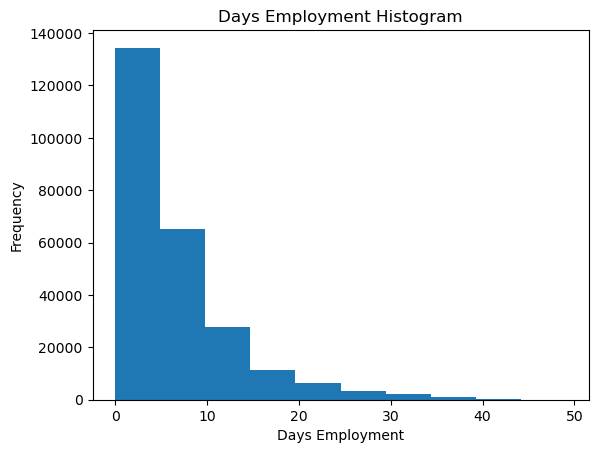

In [29]:
# remplacer les valeurs "-1000,..." par des NAN
arr = np.where(np.isclose(app_train['DAYS_EMPLOYED'].values, -1000.665753), np.nan, app_train['DAYS_EMPLOYED'].values)
app_train['DAYS_EMPLOYED'] = pd.Series(arr, index=app_train['DAYS_EMPLOYED'].index)

app_train['DAYS_EMPLOYED'].plot.hist(title = 'Days Employment Histogram');
plt.xlabel('Days Employment')

In [30]:
app_train.shape

(307511, 70)

In [31]:
# traitemetn des colonnes relatives a la superficie des logements/terains
selected_columns = app_train.filter(regex='FLAG_DOC')
app_train['CNT_DOCUMENTS'] = selected_columns.sum(axis=1)
app_train.drop(['FLAG_DOCUMENT_2','FLAG_DOCUMENT_3','FLAG_DOCUMENT_4','FLAG_DOCUMENT_5','FLAG_DOCUMENT_6',
'FLAG_DOCUMENT_7','FLAG_DOCUMENT_8','FLAG_DOCUMENT_9','FLAG_DOCUMENT_10','FLAG_DOCUMENT_11',
'FLAG_DOCUMENT_12','FLAG_DOCUMENT_13','FLAG_DOCUMENT_14','FLAG_DOCUMENT_15','FLAG_DOCUMENT_16',
'FLAG_DOCUMENT_17','FLAG_DOCUMENT_18','FLAG_DOCUMENT_19','FLAG_DOCUMENT_20','FLAG_DOCUMENT_21'],axis=1,inplace=True)

In [32]:
px.histogram(app_train,x='CNT_DOCUMENTS',color='TARGET',barmode='group')

In [33]:
# Créer un masque booléen pour sélectionner les lignes où la valeur de la colonne 'docu' est <= 1
mask = app_train['CNT_DOCUMENTS'] <= 1

# Supprimer les lignes qui ne satisfont pas le masque
app_train = app_train[mask]

In [34]:
app_train.shape

(299605, 51)

In [35]:
# continuation de degageage de features inutiles

#Supprimer avec cette fonction quelques facteurs dont on n'a pas besoin
for column in app_train.columns:
    if ('_AVG' in column)  or (('_MODE' in column) and column !='HOUSETYPE_MODE') or ('_MEDI' in column) or ('_CNT_SOCIAL' in column) or ('AMT_REQ_CREDIT' in column):
        app_train.drop(column,1, inplace=True)

In [36]:
app_train.shape

(299605, 38)

### certaines anomalies au niveau des adresses

In [37]:
# L'adresse de contact doit correspondre à l'adresse permanente et/ou celle de travail : Region
def adresse_reg(df):
    Region = df.index[df['REG_REGION_NOT_LIVE_REGION'] + df['LIVE_REGION_NOT_WORK_REGION'] ==2]
    return Region

print("Le nombre de demandeur de crédit dont l'adresse de contact (Region) ne correspond ni à l'adresse permanente (Region) ni à celle de travail (Region) est ", len(adresse_reg(app_train)))
# Supprimer ces demandes de crédit
app_train.drop(adresse_reg(app_train), inplace=True)

Le nombre de demandeur de crédit dont l'adresse de contact (Region) ne correspond ni à l'adresse permanente (Region) ni à celle de travail (Region) est  813


In [38]:
# L'adresse de contact doit correspondre à l'adresse permanente et/ou celle de travail : Ville
def adresse_cit(df):
    City = df.index[df['REG_CITY_NOT_LIVE_CITY'] + df['LIVE_CITY_NOT_WORK_CITY'] ==2]
    return City

print("Le nombre de demandeur de crédit dont l'adresse de contact (Ville) ne correspond ni à l'adresse permanente (Ville) ni à celle de travail (Ville) est ", len(adresse_cit(app_train)))

Le nombre de demandeur de crédit dont l'adresse de contact (Ville) ne correspond ni à l'adresse permanente (Ville) ni à celle de travail (Ville) est  4522


In [39]:
# supprimer les 2 features 
app_train.drop(['REG_CITY_NOT_LIVE_CITY', 'LIVE_CITY_NOT_WORK_CITY','REG_REGION_NOT_LIVE_REGION', 'LIVE_REGION_NOT_WORK_REGION'], axis = 1, inplace = True)

In [40]:
app_train.shape

(298792, 34)

In [41]:
app_train.dtypes

SK_ID_CURR                       int64
TARGET                           int64
NAME_CONTRACT_TYPE              object
CODE_GENDER                     object
FLAG_OWN_CAR                    object
FLAG_OWN_REALTY                 object
CNT_CHILDREN                     int64
AMT_INCOME_TOTAL               float64
AMT_CREDIT                     float64
AMT_ANNUITY                    float64
AMT_GOODS_PRICE                float64
NAME_INCOME_TYPE                object
NAME_EDUCATION_TYPE             object
NAME_FAMILY_STATUS              object
NAME_HOUSING_TYPE               object
DAYS_BIRTH                     float64
DAYS_EMPLOYED                  float64
OCCUPATION_TYPE                 object
CNT_FAM_MEMBERS                float64
REGION_RATING_CLIENT             int64
REGION_RATING_CLIENT_W_CITY      int64
ORGANIZATION_TYPE               object
EXT_SOURCE_1                   float64
EXT_SOURCE_2                   float64
EXT_SOURCE_3                   float64
HOUSETYPE_MODE           

In [42]:
missing_value(app_train)

Il y a 9 colonnes avec des valeurs manquantes qui sont :


,Nombre de valeurs vides,Pourcentage sur le total
EXT_SOURCE_1,168997,56.5601
HOUSETYPE_MODE,150747,50.4522
OCCUPATION_TYPE,94822,31.7351
EXT_SOURCE_3,59613,19.9513
DAYS_EMPLOYED,55271,18.4982
EXT_SOURCE_2,653,0.2185
AMT_GOODS_PRICE,276,0.0924
AMT_ANNUITY,11,0.0037
CNT_FAM_MEMBERS,2,0.0007


# ===== BUREAU =====

In [43]:
bureau = pd.read_csv('data/bureau.csv')

In [44]:
#Supprimer des facteurs unitiles
bureau_clean = bureau.copy()
bureau_clean.drop(['CREDIT_CURRENCY', 'DAYS_CREDIT_ENDDATE', 'AMT_CREDIT_MAX_OVERDUE',
                  'CNT_CREDIT_PROLONG', 'AMT_CREDIT_SUM_LIMIT', 'CREDIT_TYPE', 'DAYS_CREDIT_UPDATE',
                  'DAYS_CREDIT', 'DAYS_ENDDATE_FACT'], axis = 1, inplace = True)

In [45]:
bureau_clean.shape

(1716428, 8)

In [46]:
bureau_clean.duplicated().sum()

0

In [47]:
col = bureau_clean.select_dtypes(exclude = 'object')
col

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_DAY_OVERDUE,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_OVERDUE,AMT_ANNUITY
0,215354,5714462,0,91323.00,0.0,0.0,NaN
1,215354,5714463,0,225000.00,171342.0,0.0,NaN
2,215354,5714464,0,464323.50,NaN,0.0,NaN
3,215354,5714465,0,90000.00,NaN,0.0,NaN
4,215354,5714466,0,2700000.00,NaN,0.0,NaN
...,...,...,...,...,...,...,...
1716423,259355,5057750,0,11250.00,11250.0,0.0,NaN
1716424,100044,5057754,0,38130.84,0.0,0.0,NaN
1716425,100044,5057762,0,15570.00,NaN,0.0,NaN
1716426,246829,5057770,0,36000.00,0.0,0.0,NaN


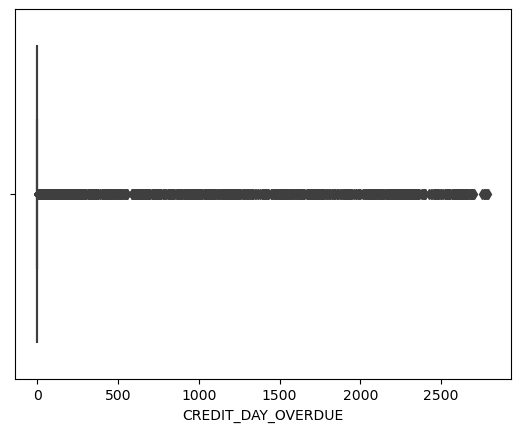

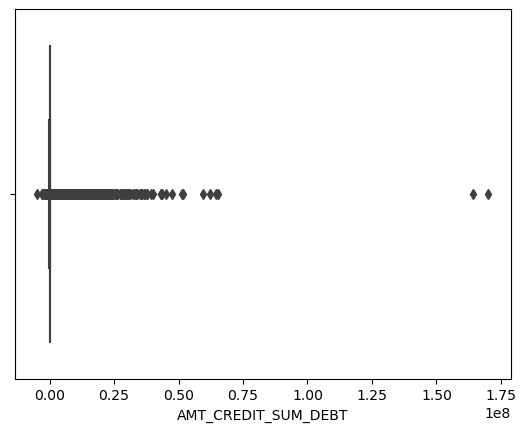

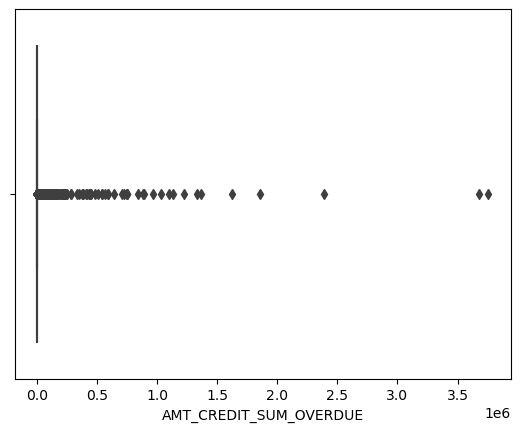

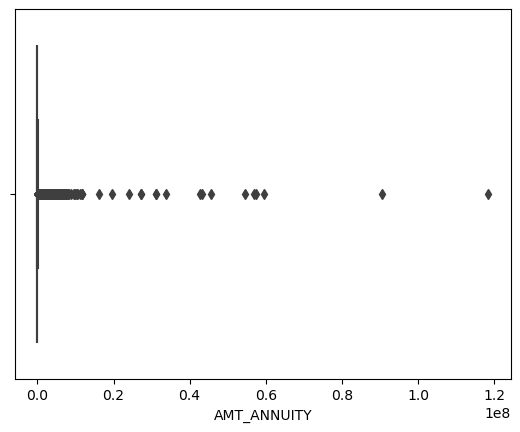

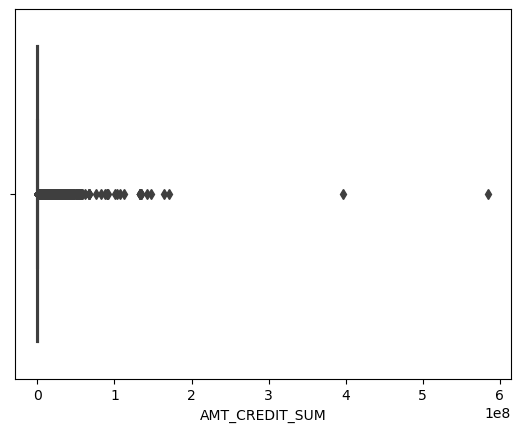

In [48]:
col = ['CREDIT_DAY_OVERDUE','AMT_CREDIT_SUM_DEBT','AMT_CREDIT_SUM_OVERDUE','AMT_ANNUITY','AMT_CREDIT_SUM']

for i in col:
    sns.boxplot(x=i, data=bureau_clean)
    plt.show() 

In [49]:
# Supposons que votre DataFrame s'appelle 'bureau_clean' et que vous avez une liste de colonnes à vérifier appelée 'liste_colonnes'

# Calculer le maximum pour chaque colonne dans la liste
max_par_colonne = bureau_clean[col].max()
moyenne_par_colonne = bureau_clean[col].mean()
medianne_par_colonne = bureau_clean[col].median()

print("Maximum pour chaque colonne :", max_par_colonne)
print("Moyenne pour chaque colonne :", moyenne_par_colonne)
print("Medianne pour chaque colonne :", medianne_par_colonne)


Maximum pour chaque colonne : CREDIT_DAY_OVERDUE             2792.0
AMT_CREDIT_SUM_DEBT       170100000.0
AMT_CREDIT_SUM_OVERDUE      3756681.0
AMT_ANNUITY               118453423.5
AMT_CREDIT_SUM            585000000.0
dtype: float64
Moyenne pour chaque colonne : CREDIT_DAY_OVERDUE             0.818167
AMT_CREDIT_SUM_DEBT       137085.119952
AMT_CREDIT_SUM_OVERDUE        37.912758
AMT_ANNUITY                15712.757700
AMT_CREDIT_SUM            354994.591918
dtype: float64
Medianne pour chaque colonne : CREDIT_DAY_OVERDUE             0.0
AMT_CREDIT_SUM_DEBT            0.0
AMT_CREDIT_SUM_OVERDUE         0.0
AMT_ANNUITY                    0.0
AMT_CREDIT_SUM            125518.5
dtype: float64


In [50]:
print(bureau_clean.AMT_CREDIT_SUM_OVERDUE.max())
print(bureau_clean.AMT_CREDIT_SUM_OVERDUE.mean())
print((bureau_clean.AMT_CREDIT_SUM_OVERDUE< 0).sum())
print((bureau_clean.AMT_CREDIT_SUM_OVERDUE== 0).sum())
print((bureau_clean.AMT_CREDIT_SUM_OVERDUE> 0).sum())
print('la colonne AMT_CREDIT_OVERDUE sera supprimée')

3756681.0
37.91275774165883
0
1712270
4158
la colonne AMT_CREDIT_OVERDUE sera supprimée


In [51]:
# suppression de lignes avec des valeurs abérantes pour chacune des 4 colonnes
seuils = {'AMT_CREDIT_SUM_DEBT': 15, 
          'AMT_CREDIT_SUM_OVERDUE': 10, 
          'AMT_ANNUITY': 15,
          'AMT_CREDIT_SUM' : 300000}  # Remplacez par vos valeurs seuils pour chaque colonne

bureau_clean = bureau_clean.drop(bureau_clean[(bureau_clean['AMT_CREDIT_SUM_DEBT'] > 15) |
                                                                        (bureau_clean['AMT_CREDIT_SUM_OVERDUE'] > 30) |
                                                                        (bureau_clean['AMT_ANNUITY'] > 15) |
                                                                        (bureau_clean['AMT_CREDIT_SUM'] > 300000)].index)

In [52]:
bureau_clean.shape

(944505, 8)

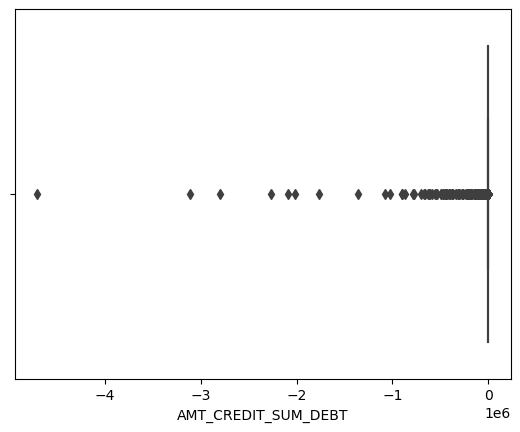

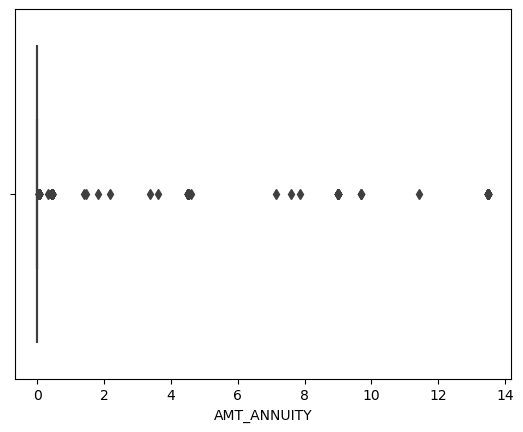

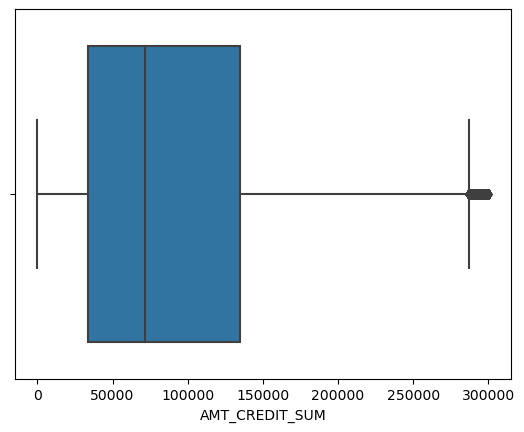

In [53]:
col = ['AMT_CREDIT_SUM_DEBT','AMT_ANNUITY','AMT_CREDIT_SUM']

for i in col:
    sns.boxplot(x=i, data=bureau_clean)
    plt.show() 

In [54]:
# Supposons que votre DataFrame s'appelle 'bureau_clean' et que vous avez une liste de colonnes à vérifier appelée 'liste_colonnes'

# Calculer le maximum pour chaque colonne dans la liste
max_par_colonne = bureau_clean[col].max()
moyenne_par_colonne = bureau_clean[col].mean()
medianne_par_colonne = bureau_clean[col].median()

print("Maximum pour chaque colonne :", max_par_colonne)
print("Moyenne pour chaque colonne :", moyenne_par_colonne)
print("Medianne pour chaque colonne :", medianne_par_colonne)

Maximum pour chaque colonne : AMT_CREDIT_SUM_DEBT        14.895
AMT_ANNUITY                13.500
AMT_CREDIT_SUM         299992.185
dtype: float64
Moyenne pour chaque colonne : AMT_CREDIT_SUM_DEBT      -77.858345
AMT_ANNUITY                0.005574
AMT_CREDIT_SUM         90588.458748
dtype: float64
Medianne pour chaque colonne : AMT_CREDIT_SUM_DEBT        0.0
AMT_ANNUITY                0.0
AMT_CREDIT_SUM         71262.0
dtype: float64


In [55]:
bureau_clean.describe()


,SK_ID_CURR,SK_ID_BUREAU,CREDIT_DAY_OVERDUE,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_OVERDUE,AMT_ANNUITY
count,944505.000000,9.445050e+05,944505.000000,944500.000000,7.869030e+05,944505.000000,175008.000000
mean,278198.437538,5.915468e+06,0.364631,90588.458748,-7.785834e+01,0.002423,0.005574
std,102943.517374,5.327736e+05,26.019845,72228.537724,9.666213e+03,0.188514,0.234450
min,100001.000000,5.000000e+06,0.000000,0.000000,-4.705600e+06,0.000000,0.000000
25%,188885.000000,5.453350e+06,0.000000,33700.500000,0.000000e+00,0.000000,0.000000
50%,277905.000000,5.905418e+06,0.000000,71262.000000,0.000000e+00,0.000000,0.000000
75%,367502.000000,6.380640e+06,0.000000,135000.000000,0.000000e+00,0.000000,0.000000
max,456255.000000,6.843457e+06,2781.000000,299992.185000,1.489500e+01,27.000000,13.500000


In [56]:
print('AMT_CREDIT_SUM_DEPT A DES VAMEURS NEGATIVE ON VA TRAITER CA PLUS TARD')

AMT_CREDIT_SUM_DEPT A DES VAMEURS NEGATIVE ON VA TRAITER CA PLUS TARD


In [57]:
(bureau_clean['AMT_CREDIT_SUM_OVERDUE']>3).sum()

222

In [58]:
bureau_clean.shape

(944505, 8)

In [59]:
bureau_clean.describe()

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_DAY_OVERDUE,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_OVERDUE,AMT_ANNUITY
count,944505.000000,9.445050e+05,944505.000000,944500.000000,7.869030e+05,944505.000000,175008.000000
mean,278198.437538,5.915468e+06,0.364631,90588.458748,-7.785834e+01,0.002423,0.005574
std,102943.517374,5.327736e+05,26.019845,72228.537724,9.666213e+03,0.188514,0.234450
min,100001.000000,5.000000e+06,0.000000,0.000000,-4.705600e+06,0.000000,0.000000
25%,188885.000000,5.453350e+06,0.000000,33700.500000,0.000000e+00,0.000000,0.000000
50%,277905.000000,5.905418e+06,0.000000,71262.000000,0.000000e+00,0.000000,0.000000
75%,367502.000000,6.380640e+06,0.000000,135000.000000,0.000000e+00,0.000000,0.000000
max,456255.000000,6.843457e+06,2781.000000,299992.185000,1.489500e+01,27.000000,13.500000


In [60]:
bureau_clean.shape

(944505, 8)

In [61]:
bureau_clean.drop('AMT_CREDIT_SUM_OVERDUE',axis=1,inplace=True)

In [62]:
bureau_clean.shape

(944505, 7)

In [63]:
# multip^lier par -1 la colonnes car trop de valeurs negative ???
bureau_clean['AMT_CREDIT_SUM_DEBT'] = bureau_clean['AMT_CREDIT_SUM_DEBT']*-1

In [64]:
# considerer la valeur negative comme bizarre et les supprimer
bureau_clean['AMT_CREDIT_SUM_DEBT'] = bureau_clean['AMT_CREDIT_SUM_DEBT']>0

In [65]:
anom = bureau_clean[bureau_clean['AMT_CREDIT_SUM_DEBT'] < 0]
print('Il y a %d valeurs aberrantes de dette' % len(anom))

Il y a 0 valeurs aberrantes de dette


In [66]:
bureau_clean.shape

(944505, 7)

In [67]:
bureau_clean['AMT_ANNUITY_CREDIT_RATIO'] = bureau_clean['AMT_ANNUITY'] / (bureau_clean['AMT_CREDIT_SUM'] + 0.00001)
# ajout de + 0.00001 pour eviter la division par 0

In [68]:
missing_value(bureau_clean)

Il y a 3 colonnes avec des valeurs manquantes qui sont :


,Nombre de valeurs vides,Pourcentage sur le total
AMT_ANNUITY,769497,81.4709
AMT_ANNUITY_CREDIT_RATIO,769497,81.4709
AMT_CREDIT_SUM,5,0.0005


#### il y a trop de valeur manquantes dans amount annuity, nou allons supprimer cette colonne et supprimer les 5 lignes de AMT credi SUM, nous feront un group by sur les id pour voir s'il est possible d'améliorer cette table avant de passer a la suite

In [69]:
bureau_clean.drop('AMT_ANNUITY', axis=1, inplace=True)

In [70]:
# Supprimer les lignes avec des valeurs manquantes dans la colonne "amt"
bureau_clean.dropna(subset=['AMT_CREDIT_SUM'], inplace=True)

In [71]:
bureau_clean.shape

(944500, 7)

#### traitement rapide sur les donées categorielles

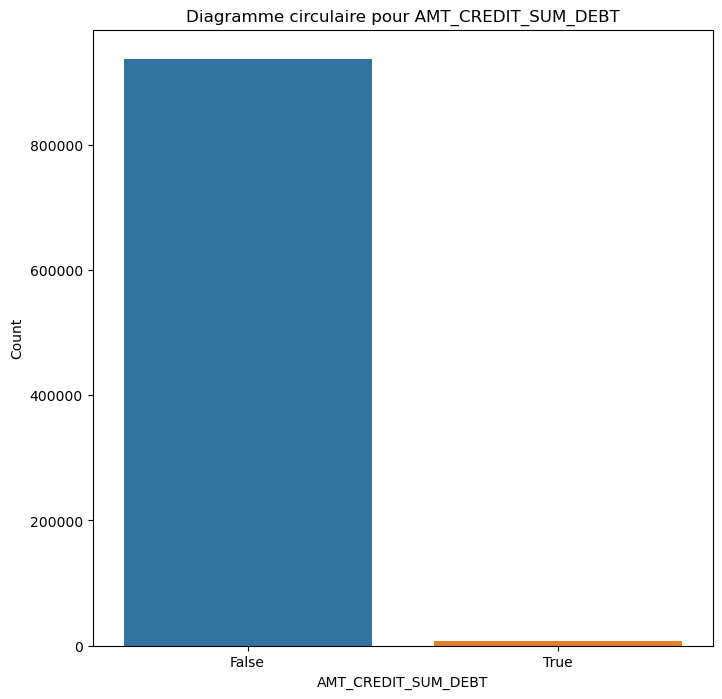

In [72]:
plt.figure(figsize=(8, 8))
sns.countplot(data=bureau_clean, x='AMT_CREDIT_SUM_DEBT')
plt.title('Diagramme circulaire pour AMT_CREDIT_SUM_DEBT')
plt.xlabel('AMT_CREDIT_SUM_DEBT')
plt.ylabel('Count')
plt.show()

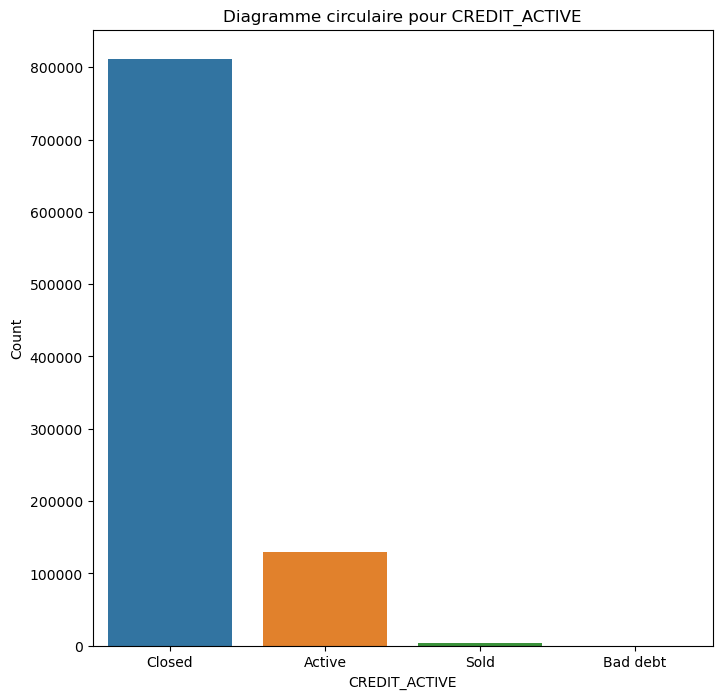

In [73]:
# Diagramme circulaire pour 'CREDIT_ACTIVE'
plt.figure(figsize=(8, 8))
sns.countplot(data=bureau_clean, x='CREDIT_ACTIVE')
plt.title('Diagramme circulaire pour CREDIT_ACTIVE')
plt.xlabel('CREDIT_ACTIVE')
plt.ylabel('Count')
plt.show()

In [74]:
bureau_clean.head()

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_DAY_OVERDUE,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_ANNUITY_CREDIT_RATIO
0,215354,5714462,Closed,0,91323.00,False,NaN
3,215354,5714465,Active,0,90000.00,False,NaN
7,162297,5714469,Closed,0,76878.45,False,NaN
8,162297,5714470,Closed,0,103007.70,False,NaN
9,162297,5714471,Active,0,4500.00,False,NaN


In [75]:
bureau_clean.drop(['CREDIT_DAY_OVERDUE','AMT_CREDIT_SUM_DEBT','AMT_ANNUITY_CREDIT_RATIO','CREDIT_ACTIVE'],axis=1, inplace=True)

In [76]:
bureau_clean.head()

,SK_ID_CURR,SK_ID_BUREAU,AMT_CREDIT_SUM
0,215354,5714462,91323.00
3,215354,5714465,90000.00
7,162297,5714469,76878.45
8,162297,5714470,103007.70
9,162297,5714471,4500.00


# previous application rapide traitement

In [77]:
previous_application=pd.read_csv('data/previous_application.csv')

In [78]:
previous_application

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.000000,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1670209,2300464,352015,Consumer loans,14704.290,267295.5,311400.0,0.0,267295.5,WEDNESDAY,12,Y,1,0.000000,NaN,NaN,XAP,Approved,-544,Cash through the bank,XAP,NaN,Refreshed,Furniture,POS,XNA,Stone,43,Furniture,30.0,low_normal,POS industry with interest,365243.0,-508.0,362.0,-358.0,-351.0,0.0
1670210,2357031,334635,Consumer loans,6622.020,87750.0,64291.5,29250.0,87750.0,TUESDAY,15,Y,1,0.340554,NaN,NaN,XAP,Approved,-1694,Cash through the bank,XAP,Unaccompanied,New,Furniture,POS,XNA,Stone,43,Furniture,12.0,middle,POS industry with interest,365243.0,-1604.0,-1274.0,-1304.0,-1297.0,0.0
1670211,2659632,249544,Consumer loans,11520.855,105237.0,102523.5,10525.5,105237.0,MONDAY,12,Y,1,0.101401,NaN,NaN,XAP,Approved,-1488,Cash through the bank,XAP,"Spouse, partner",Repeater,Consumer Electronics,POS,XNA,Country-wide,1370,Consumer electronics,10.0,low_normal,POS household with interest,365243.0,-1457.0,-1187.0,-1187.0,-1181.0,0.0
1670212,2785582,400317,Cash loans,18821.520,180000.0,191880.0,NaN,180000.0,WEDNESDAY,9,Y,1,NaN,NaN,NaN,XNA,Approved,-1185,Cash through the bank,XAP,Family,Repeater,XNA,Cash,x-sell,AP+ (Cash loan),-1,XNA,12.0,low_normal,Cash X-Sell: low,365243.0,-1155.0,-825.0,-825.0,-817.0,1.0


<AxesSubplot:>

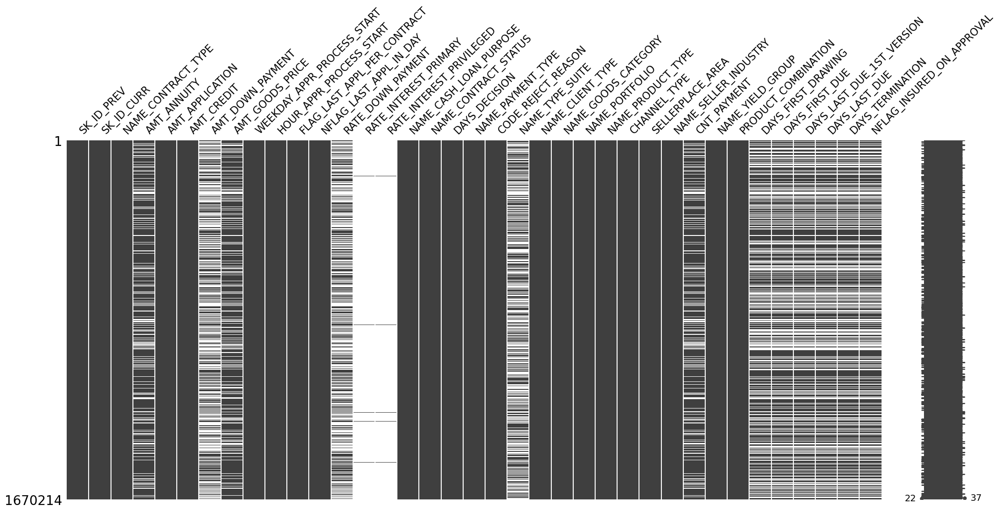

In [79]:
msno.matrix(previous_application)

In [80]:
supprimer_colonnes_manquantes(previous_application, 0.5)

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,17145.0,SATURDAY,15,Y,1,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,607500.0,THURSDAY,11,Y,1,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,112500.0,TUESDAY,11,Y,1,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,450000.0,MONDAY,7,Y,1,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,337500.0,THURSDAY,9,Y,1,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1670209,2300464,352015,Consumer loans,14704.290,267295.5,311400.0,267295.5,WEDNESDAY,12,Y,1,XAP,Approved,-544,Cash through the bank,XAP,NaN,Refreshed,Furniture,POS,XNA,Stone,43,Furniture,30.0,low_normal,POS industry with interest,365243.0,-508.0,362.0,-358.0,-351.0,0.0
1670210,2357031,334635,Consumer loans,6622.020,87750.0,64291.5,87750.0,TUESDAY,15,Y,1,XAP,Approved,-1694,Cash through the bank,XAP,Unaccompanied,New,Furniture,POS,XNA,Stone,43,Furniture,12.0,middle,POS industry with interest,365243.0,-1604.0,-1274.0,-1304.0,-1297.0,0.0
1670211,2659632,249544,Consumer loans,11520.855,105237.0,102523.5,105237.0,MONDAY,12,Y,1,XAP,Approved,-1488,Cash through the bank,XAP,"Spouse, partner",Repeater,Consumer Electronics,POS,XNA,Country-wide,1370,Consumer electronics,10.0,low_normal,POS household with interest,365243.0,-1457.0,-1187.0,-1187.0,-1181.0,0.0
1670212,2785582,400317,Cash loans,18821.520,180000.0,191880.0,180000.0,WEDNESDAY,9,Y,1,XNA,Approved,-1185,Cash through the bank,XAP,Family,Repeater,XNA,Cash,x-sell,AP+ (Cash loan),-1,XNA,12.0,low_normal,Cash X-Sell: low,365243.0,-1155.0,-825.0,-825.0,-817.0,1.0


In [81]:
print("-"*100)
print("Merging TARGET with previous_application Table")
prev_merged = app_train.iloc[:,:2].merge(previous_application, on = 'SK_ID_CURR', how = 'left')
print("-"*100)

----------------------------------------------------------------------------------------------------
Merging TARGET with previous_application Table
----------------------------------------------------------------------------------------------------


In [82]:
prev_merged.dtypes

SK_ID_CURR                       int64
TARGET                           int64
SK_ID_PREV                     float64
NAME_CONTRACT_TYPE              object
AMT_ANNUITY                    float64
AMT_APPLICATION                float64
AMT_CREDIT                     float64
AMT_DOWN_PAYMENT               float64
AMT_GOODS_PRICE                float64
WEEKDAY_APPR_PROCESS_START      object
HOUR_APPR_PROCESS_START        float64
FLAG_LAST_APPL_PER_CONTRACT     object
NFLAG_LAST_APPL_IN_DAY         float64
RATE_DOWN_PAYMENT              float64
RATE_INTEREST_PRIMARY          float64
RATE_INTEREST_PRIVILEGED       float64
NAME_CASH_LOAN_PURPOSE          object
NAME_CONTRACT_STATUS            object
DAYS_DECISION                  float64
NAME_PAYMENT_TYPE               object
CODE_REJECT_REASON              object
NAME_TYPE_SUITE                 object
NAME_CLIENT_TYPE                object
NAME_GOODS_CATEGORY             object
NAME_PORTFOLIO                  object
NAME_PRODUCT_TYPE        

#### analyse rapide données nuériques

In [83]:
supprimer_colonnes_manquantes(prev_merged, 0.5)

,SK_ID_CURR,TARGET,SK_ID_PREV,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,100002,1,1038818.0,Consumer loans,9251.775,179055.0,179055.0,179055.0,SATURDAY,9.0,Y,1.0,XAP,Approved,-606.0,XNA,XAP,NaN,New,Vehicles,POS,XNA,Stone,500.0,Auto technology,24.0,low_normal,POS other with interest,365243.0,-565.0,125.0,-25.0,-17.0,0.0
1,100003,0,1810518.0,Cash loans,98356.995,900000.0,1035882.0,900000.0,FRIDAY,12.0,Y,1.0,XNA,Approved,-746.0,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1.0,XNA,12.0,low_normal,Cash X-Sell: low,365243.0,-716.0,-386.0,-536.0,-527.0,1.0
2,100003,0,2636178.0,Consumer loans,64567.665,337500.0,348637.5,337500.0,SUNDAY,17.0,Y,1.0,XAP,Approved,-828.0,Cash through the bank,XAP,Family,Refreshed,Furniture,POS,XNA,Stone,1400.0,Furniture,6.0,middle,POS industry with interest,365243.0,-797.0,-647.0,-647.0,-639.0,0.0
3,100003,0,2396755.0,Consumer loans,6737.310,68809.5,68053.5,68809.5,SATURDAY,15.0,Y,1.0,XAP,Approved,-2341.0,Cash through the bank,XAP,Family,Refreshed,Consumer Electronics,POS,XNA,Country-wide,200.0,Consumer electronics,12.0,middle,POS household with interest,365243.0,-2310.0,-1980.0,-1980.0,-1976.0,1.0
4,100004,0,1564014.0,Consumer loans,5357.250,24282.0,20106.0,24282.0,FRIDAY,5.0,Y,1.0,XAP,Approved,-815.0,Cash through the bank,XAP,Unaccompanied,New,Mobile,POS,XNA,Regional / Local,30.0,Connectivity,4.0,middle,POS mobile without interest,365243.0,-784.0,-694.0,-724.0,-714.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1403786,456255,0,2073384.0,Cash loans,16400.610,229500.0,254340.0,229500.0,THURSDAY,12.0,Y,1.0,XNA,Approved,-648.0,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1.0,XNA,24.0,middle,Cash X-Sell: middle,365243.0,-618.0,72.0,-558.0,-528.0,1.0
1403787,456255,0,1708056.0,Revolving loans,2250.000,45000.0,45000.0,45000.0,SUNDAY,14.0,Y,1.0,XAP,Refused,-456.0,XNA,HC,Unaccompanied,Repeater,XNA,Cards,walk-in,Country-wide,20.0,Connectivity,0.0,XNA,Card Street,NaN,NaN,NaN,NaN,NaN,NaN
1403788,456255,0,1296007.0,Cash loans,30737.655,765000.0,1067940.0,765000.0,FRIDAY,14.0,Y,1.0,Repairs,Refused,-171.0,Cash through the bank,HC,Unaccompanied,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1.0,XNA,60.0,low_normal,Cash Street: low,NaN,NaN,NaN,NaN,NaN,NaN
1403789,456255,0,2631384.0,Cash loans,54022.140,1170000.0,1271929.5,1170000.0,FRIDAY,14.0,Y,1.0,XNA,Approved,-787.0,Cash through the bank,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,AP+ (Cash loan),6.0,XNA,36.0,low_normal,Cash X-Sell: low,365243.0,-756.0,294.0,-66.0,-64.0,0.0


In [84]:
num = prev_merged.select_dtypes(exclude='object')

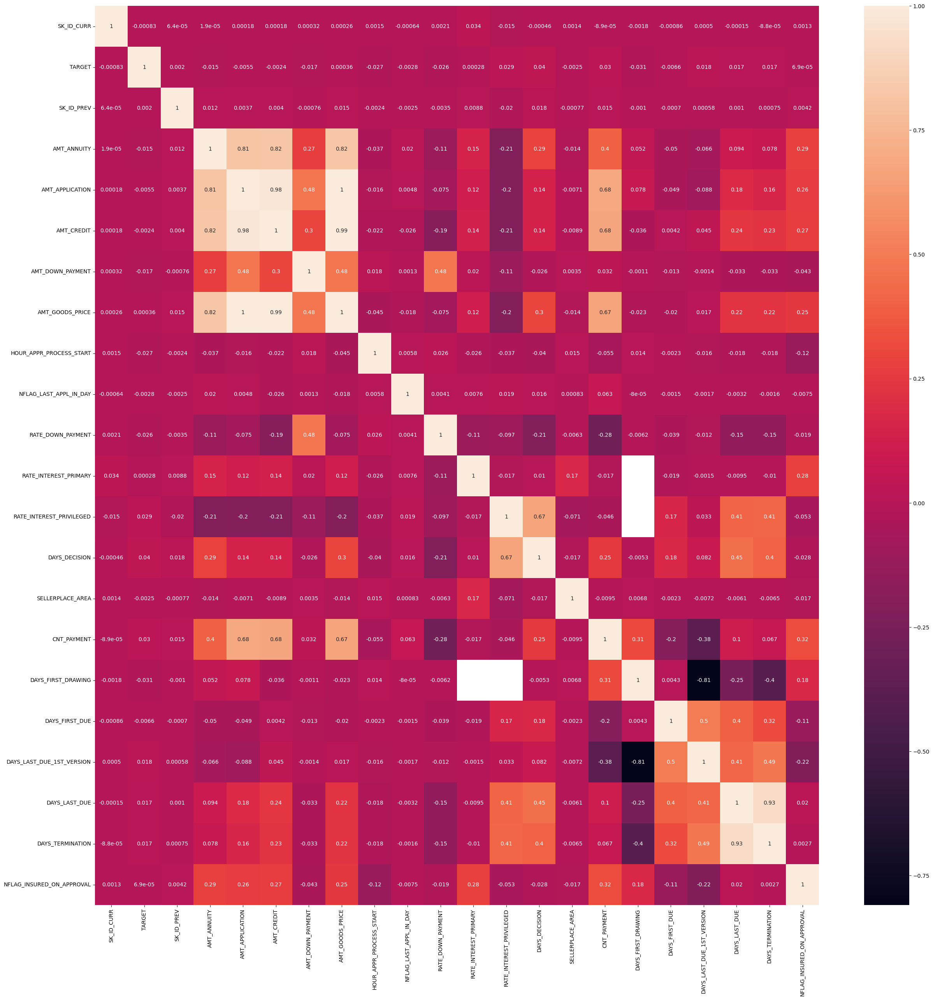

In [85]:
plt.figure(figsize=(30, 30))
sns.heatmap(num.corr(),annot=True)
plt.show()

In [86]:
positive_target = prev_merged[prev_merged['TARGET'] ==0]
negative_target = prev_merged[prev_merged['TARGET'] == 1]
print(positive_target.shape,negative_target.shape)


(1281772, 38) (122019, 38)


In [87]:
prev_merged.columns

Index(['SK_ID_CURR', 'TARGET', 'SK_ID_PREV', 'NAME_CONTRACT_TYPE',
       'AMT_ANNUITY', 'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT',
       'AMT_GOODS_PRICE', 'WEEKDAY_APPR_PROCESS_START',
       'HOUR_APPR_PROCESS_START', 'FLAG_LAST_APPL_PER_CONTRACT',
       'NFLAG_LAST_APPL_IN_DAY', 'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
       'CODE_REJECT_REASON', 'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY',
       'CNT_PAYMENT', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION',
       'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')

In [88]:
prev_merged['CREDIT_DURATION'] = prev_merged['AMT_CREDIT']/prev_merged['AMT_ANNUITY']

In [89]:
prev_merged

,SK_ID_CURR,TARGET,SK_ID_PREV,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL,CREDIT_DURATION
0,100002,1,1038818.0,Consumer loans,9251.775,179055.0,179055.0,0.0,179055.0,SATURDAY,9.0,Y,1.0,0.000000,NaN,NaN,XAP,Approved,-606.0,XNA,XAP,NaN,New,Vehicles,POS,XNA,Stone,500.0,Auto technology,24.0,low_normal,POS other with interest,365243.0,-565.0,125.0,-25.0,-17.0,0.0,19.353584
1,100003,0,1810518.0,Cash loans,98356.995,900000.0,1035882.0,NaN,900000.0,FRIDAY,12.0,Y,1.0,NaN,NaN,NaN,XNA,Approved,-746.0,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1.0,XNA,12.0,low_normal,Cash X-Sell: low,365243.0,-716.0,-386.0,-536.0,-527.0,1.0,10.531859
2,100003,0,2636178.0,Consumer loans,64567.665,337500.0,348637.5,0.0,337500.0,SUNDAY,17.0,Y,1.0,0.000000,NaN,NaN,XAP,Approved,-828.0,Cash through the bank,XAP,Family,Refreshed,Furniture,POS,XNA,Stone,1400.0,Furniture,6.0,middle,POS industry with interest,365243.0,-797.0,-647.0,-647.0,-639.0,0.0,5.399568
3,100003,0,2396755.0,Consumer loans,6737.310,68809.5,68053.5,6885.0,68809.5,SATURDAY,15.0,Y,1.0,0.100061,NaN,NaN,XAP,Approved,-2341.0,Cash through the bank,XAP,Family,Refreshed,Consumer Electronics,POS,XNA,Country-wide,200.0,Consumer electronics,12.0,middle,POS household with interest,365243.0,-2310.0,-1980.0,-1980.0,-1976.0,1.0,10.100990
4,100004,0,1564014.0,Consumer loans,5357.250,24282.0,20106.0,4860.0,24282.0,FRIDAY,5.0,Y,1.0,0.212008,NaN,NaN,XAP,Approved,-815.0,Cash through the bank,XAP,Unaccompanied,New,Mobile,POS,XNA,Regional / Local,30.0,Connectivity,4.0,middle,POS mobile without interest,365243.0,-784.0,-694.0,-724.0,-714.0,0.0,3.753045
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1403786,456255,0,2073384.0,Cash loans,16400.610,229500.0,254340.0,NaN,229500.0,THURSDAY,12.0,Y,1.0,NaN,NaN,NaN,XNA,Approved,-648.0,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1.0,XNA,24.0,middle,Cash X-Sell: middle,365243.0,-618.0,72.0,-558.0,-528.0,1.0,15.507960
1403787,456255,0,1708056.0,Revolving loans,2250.000,45000.0,45000.0,NaN,45000.0,SUNDAY,14.0,Y,1.0,NaN,NaN,NaN,XAP,Refused,-456.0,XNA,HC,Unaccompanied,Repeater,XNA,Cards,walk-in,Country-wide,20.0,Connectivity,0.0,XNA,Card Street,NaN,NaN,NaN,NaN,NaN,NaN,20.000000
1403788,456255,0,1296007.0,Cash loans,30737.655,765000.0,1067940.0,NaN,765000.0,FRIDAY,14.0,Y,1.0,NaN,NaN,NaN,Repairs,Refused,-171.0,Cash through the bank,HC,Unaccompanied,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1.0,XNA,60.0,low_normal,Cash Street: low,NaN,NaN,NaN,NaN,NaN,NaN,34.743704
1403789,456255,0,2631384.0,Cash loans,54022.140,1170000.0,1271929.5,NaN,1170000.0,FRIDAY,14.0,Y,1.0,NaN,NaN,NaN,XNA,Approved,-787.0,Cash through the bank,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,AP+ (Cash loan),6.0,XNA,36.0,low_normal,Cash X-Sell: low,365243.0,-756.0,294.0,-66.0,-64.0,0.0,23.544597


In [90]:
prev_merged.NAME_CASH_LOAN_PURPOSE.nunique()

25

In [91]:
total_rows = len(prev_merged)

# Calculer le nombre de valeurs identiques entre les deux colonnes
nombre_valeurs_identiques = (prev_merged['AMT_APPLICATION'] == prev_merged['AMT_GOODS_PRICE']).sum()

# Calculer le taux de valeurs identiques
taux_valeurs_identiques = nombre_valeurs_identiques / total_rows

print("Le taux de valeurs identiques entre les deux colonnes est de :", taux_valeurs_identiques)

Le taux de valeurs identiques entre les deux colonnes est de : 0.7671676196812773


In [92]:
# 3/4 des valeurs sont identiques entre amt_application et amt_good_price, on va assembler les 2 colonnes et faire la moyenne
prev_merged['AMT_GOOD_PRICE_APPLCATION'] = (prev_merged['AMT_APPLICATION'] + prev_merged['AMT_GOODS_PRICE'])/2
prev_merged.drop(['AMT_APPLICATION','AMT_GOODS_PRICE'],axis=1,inplace=True)

In [93]:
prev_merged.columns

Index(['SK_ID_CURR', 'TARGET', 'SK_ID_PREV', 'NAME_CONTRACT_TYPE',
       'AMT_ANNUITY', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
       'CODE_REJECT_REASON', 'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY',
       'CNT_PAYMENT', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION',
       'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL',
       'CREDIT_DURATION', 'AMT_GOOD_PRICE_APPLCATION'],
      dtype='object')

In [94]:
missing_value(prev_merged)

Il y a 36 colonnes avec des valeurs manquantes qui sont :


,Nombre de valeurs vides,Pourcentage sur le total
RATE_INTEREST_PRIVILEGED,1399105,99.6662
RATE_INTEREST_PRIMARY,1399105,99.6662
RATE_DOWN_PAYMENT,750822,53.4853
AMT_DOWN_PAYMENT,750822,53.4853
NAME_TYPE_SUITE,696111,49.5879
NFLAG_INSURED_ON_APPROVAL,563778,40.1611
DAYS_TERMINATION,563778,40.1611
DAYS_LAST_DUE,563778,40.1611
DAYS_LAST_DUE_1ST_VERSION,563778,40.1611
DAYS_FIRST_DUE,563778,40.1611


In [95]:
cols_to_drop = ['NAME_CONTRACT_TYPE','AMT_DOWN_PAYMENT',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED','DAYS_DECISION', 'NAME_PAYMENT_TYPE',
       'CODE_REJECT_REASON', 'NAME_TYPE_SUITE','NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY','NAME_YIELD_GROUP', 'PRODUCT_COMBINATION',
       'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL']

prev_clean = prev_merged.drop(cols_to_drop,axis=1)

In [96]:
prev_clean

,SK_ID_CURR,TARGET,SK_ID_PREV,AMT_ANNUITY,AMT_CREDIT,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,NAME_CLIENT_TYPE,CNT_PAYMENT,CREDIT_DURATION,AMT_GOOD_PRICE_APPLCATION
0,100002,1,1038818.0,9251.775,179055.0,XAP,Approved,New,24.0,19.353584,179055.0
1,100003,0,1810518.0,98356.995,1035882.0,XNA,Approved,Repeater,12.0,10.531859,900000.0
2,100003,0,2636178.0,64567.665,348637.5,XAP,Approved,Refreshed,6.0,5.399568,337500.0
3,100003,0,2396755.0,6737.310,68053.5,XAP,Approved,Refreshed,12.0,10.100990,68809.5
4,100004,0,1564014.0,5357.250,20106.0,XAP,Approved,New,4.0,3.753045,24282.0
...,...,...,...,...,...,...,...,...,...,...,...
1403786,456255,0,2073384.0,16400.610,254340.0,XNA,Approved,Repeater,24.0,15.507960,229500.0
1403787,456255,0,1708056.0,2250.000,45000.0,XAP,Refused,Repeater,0.0,20.000000,45000.0
1403788,456255,0,1296007.0,30737.655,1067940.0,Repairs,Refused,Repeater,60.0,34.743704,765000.0
1403789,456255,0,2631384.0,54022.140,1271929.5,XNA,Approved,Repeater,36.0,23.544597,1170000.0


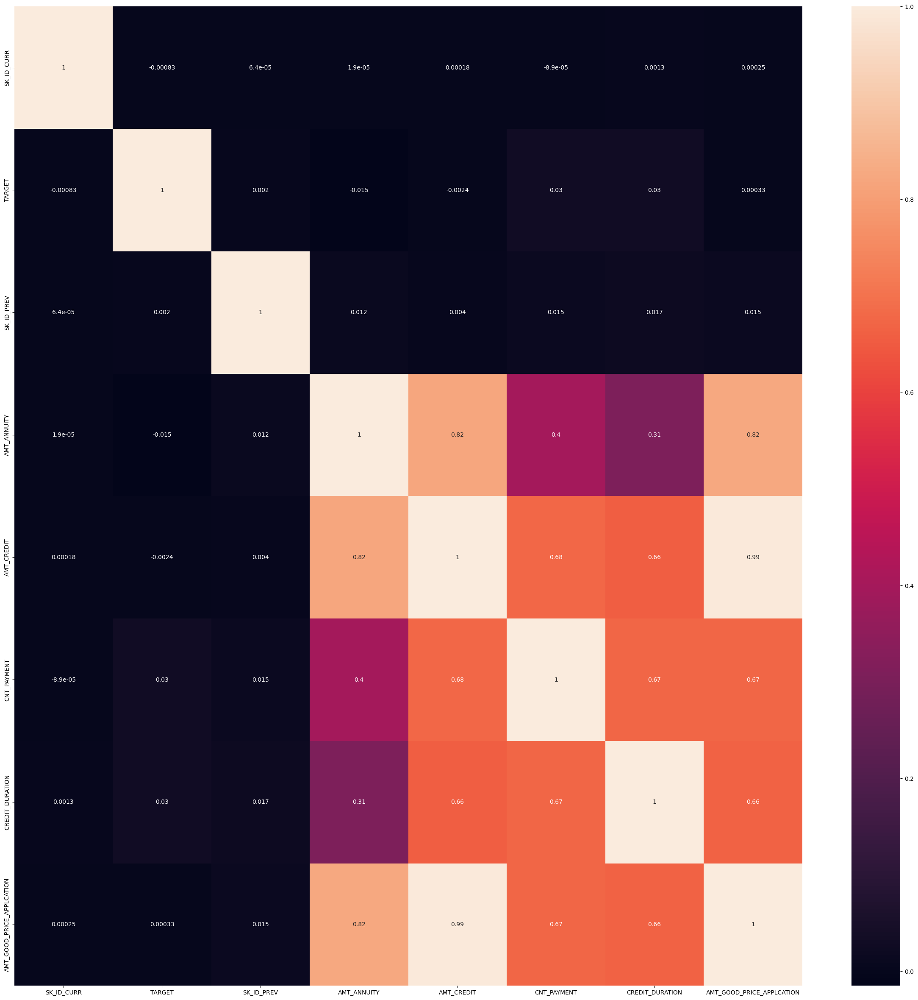

In [97]:
num = prev_clean.select_dtypes(exclude='object')
plt.figure(figsize=(30, 30))
sns.heatmap(num.corr(),annot=True)
plt.show()

In [98]:
# vu la très grande relation entre AMT good price et amt credit on va supprimer l'une des deux
prev_clean.drop('AMT_GOOD_PRICE_APPLCATION',axis=1, inplace=True)

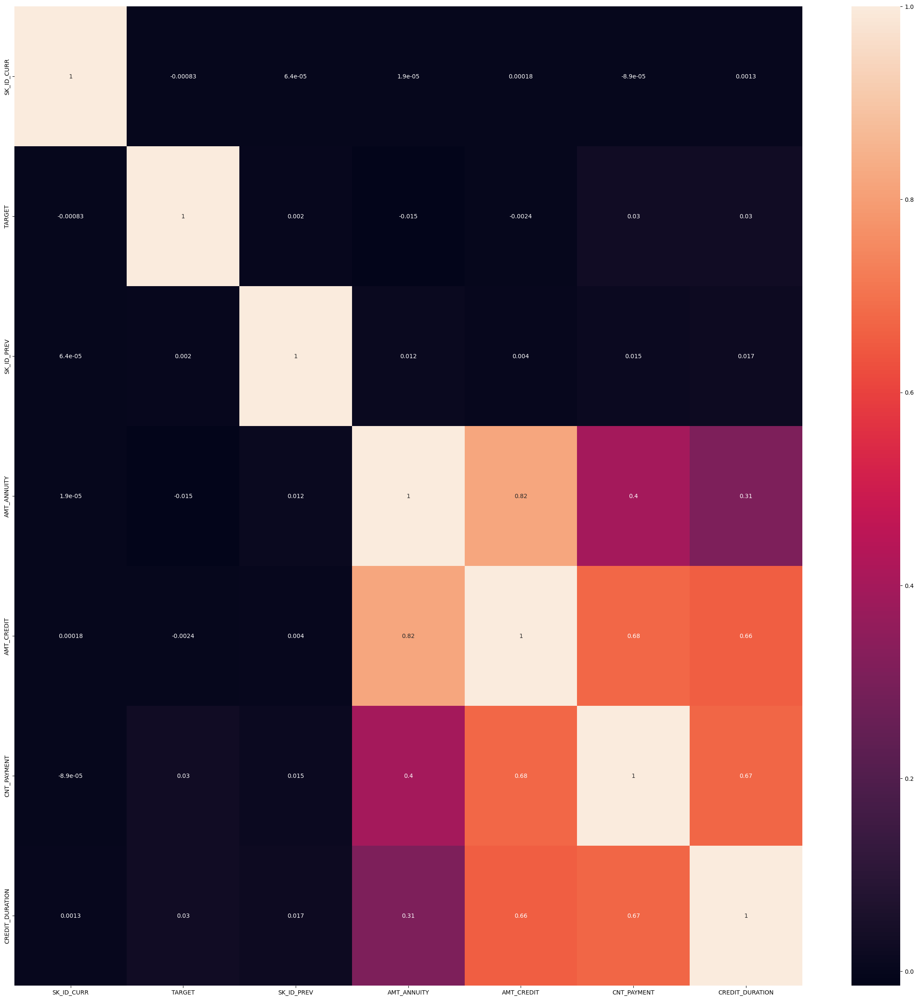

In [99]:
num = prev_clean.select_dtypes(exclude='object')
plt.figure(figsize=(30, 30))
sns.heatmap(num.corr(),annot=True)
plt.show()

In [100]:
# regard sur les colonnes categorielles
prev_clean.select_dtypes(include='object')

,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,NAME_CLIENT_TYPE
0,XAP,Approved,New
1,XNA,Approved,Repeater
2,XAP,Approved,Refreshed
3,XAP,Approved,Refreshed
4,XAP,Approved,New
...,...,...,...
1403786,XNA,Approved,Repeater
1403787,XAP,Refused,Repeater
1403788,Repairs,Refused,Repeater
1403789,XNA,Approved,Repeater


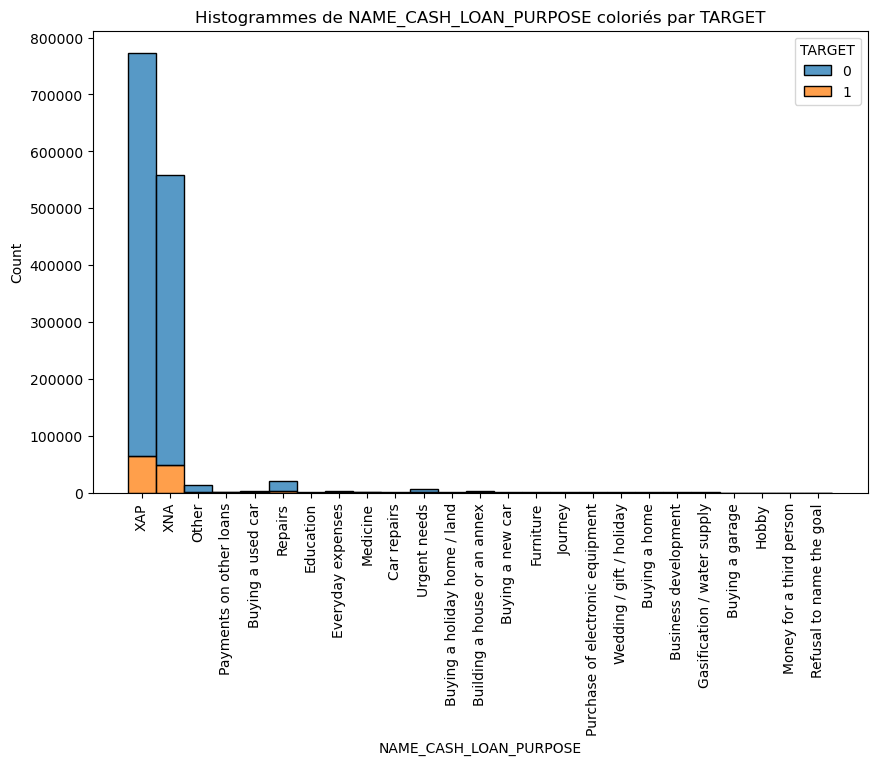

In [101]:
plt.figure(figsize=(10, 6))
sns.histplot(data=prev_clean, x='NAME_CASH_LOAN_PURPOSE', hue='TARGET', multiple='stack')
plt.title('Histogrammes de NAME_CASH_LOAN_PURPOSE coloriés par TARGET')
plt.xlabel('NAME_CASH_LOAN_PURPOSE')
plt.ylabel('Count')
plt.xticks(rotation=90)  # Rotation des étiquettes de l'axe des x pour une meilleure lisibilité
plt.show()

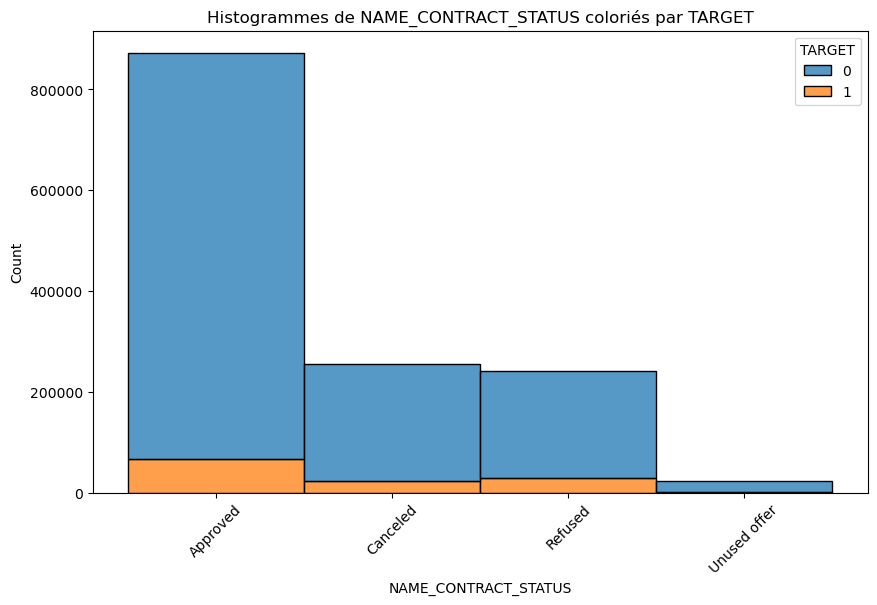

In [102]:

plt.figure(figsize=(10, 6))
sns.histplot(data=prev_clean, x='NAME_CONTRACT_STATUS', hue='TARGET', multiple='stack')
plt.title('Histogrammes de NAME_CONTRACT_STATUS coloriés par TARGET')
plt.xlabel('NAME_CONTRACT_STATUS')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Rotation des étiquettes de l'axe des x pour une meilleure lisibilité
plt.show()

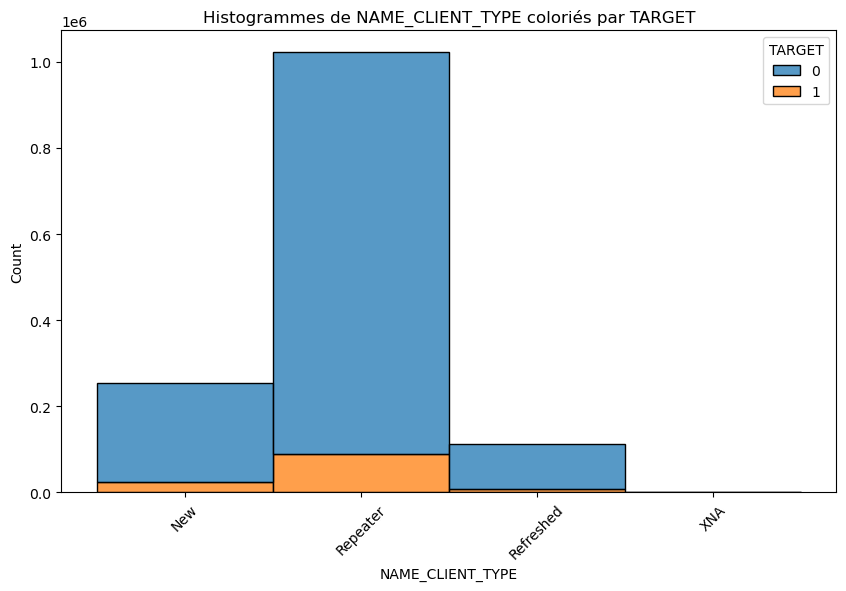

In [103]:
plt.figure(figsize=(10, 6))
sns.histplot(data=prev_clean, x='NAME_CLIENT_TYPE', hue='TARGET', multiple='stack')
plt.title('Histogrammes de NAME_CLIENT_TYPE coloriés par TARGET')
plt.xlabel('NAME_CLIENT_TYPE')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Rotation des étiquettes de l'axe des x pour une meilleure lisibilité
plt.show()

In [104]:
# pour name cash purpose le taux de xap xna etant trop grand et ne sachant pas commen les repartir entre les autre classes, il vaut mieux supprimer cette colonne
prev_clean.drop('NAME_CASH_LOAN_PURPOSE', axis=1, inplace = True)

In [105]:
# Supprimer les lignes où la valeur de la colonne 'NAME_CLIENT_TYPE' est 'XNA'
prev_clean = prev_clean[prev_clean['NAME_CLIENT_TYPE'] != 'XNA']

# Supprimer les lignes où la valeur de la colonne 'NAME_CONTRACT_STATUS' est 'Unused offer'
prev_clean = prev_clean[prev_clean['NAME_CONTRACT_STATUS'] != 'Unused offer']

In [106]:
prev_clean

,SK_ID_CURR,TARGET,SK_ID_PREV,AMT_ANNUITY,AMT_CREDIT,NAME_CONTRACT_STATUS,NAME_CLIENT_TYPE,CNT_PAYMENT,CREDIT_DURATION
0,100002,1,1038818.0,9251.775,179055.0,Approved,New,24.0,19.353584
1,100003,0,1810518.0,98356.995,1035882.0,Approved,Repeater,12.0,10.531859
2,100003,0,2636178.0,64567.665,348637.5,Approved,Refreshed,6.0,5.399568
3,100003,0,2396755.0,6737.310,68053.5,Approved,Refreshed,12.0,10.100990
4,100004,0,1564014.0,5357.250,20106.0,Approved,New,4.0,3.753045
...,...,...,...,...,...,...,...,...,...
1403786,456255,0,2073384.0,16400.610,254340.0,Approved,Repeater,24.0,15.507960
1403787,456255,0,1708056.0,2250.000,45000.0,Refused,Repeater,0.0,20.000000
1403788,456255,0,1296007.0,30737.655,1067940.0,Refused,Repeater,60.0,34.743704
1403789,456255,0,2631384.0,54022.140,1271929.5,Approved,Repeater,36.0,23.544597


## sauvegarde de mes df en csv

In [108]:
# Sauvegarder le DataFrame prev_clean en tant que fichier CSV
prev_clean.to_csv('cleanedData/prev_clean.csv', index=False)

# Sauvegarder le DataFrame bureau_clean en tant que fichier CSV
bureau_clean.to_csv('cleanedData/bureau_clean.csv', index=False)

# Sauvegarder d'autres DataFrames au besoin
app_train.to_csv('cleanedData/app_train.csv', index=False)

# ========== groupby 

In [ ]:
# nous devons merge prev_clean bureau_clean et app_train

# =============
# =============


# voir notebook projet fin etude scoring de lamine

# =============
# =============